FILTERING DATA

In [2]:
import pandas as pd

df=pd.read_csv('clustering_data.csv')
filtered_df=df[df['StateName']=='TELANGANA']
print(filtered_df)



              CircleName             RegionName        DivisionName  \
138     Telangana Circle       Hyderabad Region  Nizamabad Division   
139     Telangana Circle       Hyderabad Region  Nizamabad Division   
140     Telangana Circle       Hyderabad Region  Nizamabad Division   
141     Telangana Circle       Hyderabad Region  Nizamabad Division   
142     Telangana Circle       Hyderabad Region  Nizamabad Division   
...                  ...                    ...                 ...   
150614  Telangana Circle       Hyderabad Region   Nalgonda Division   
151046  Telangana Circle  Hyderabad City Region      Medak Division   
151047  Telangana Circle  Hyderabad City Region      Medak Division   
151048  Telangana Circle  Hyderabad City Region      Medak Division   
151049  Telangana Circle  Hyderabad City Region      Medak Division   

               OfficeName  Pincode OfficeType  Delivery             District  \
138         Arsapalli B.O   503186         BO  Delivery            

C:\Users\anush\AppData\Local\Temp\ipykernel_25684\3073479800.py:3: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('clustering_data.csv')


In [3]:

# Convert "Latitude" to numeric, setting errors='coerce' will turn invalid parsing into NaN
filtered_df['Latitude'] = pd.to_numeric(filtered_df['Latitude'], errors='coerce')
# Drop rows with NaN values in "Latitude" column
filtered_df = filtered_df.dropna(subset=['Latitude'])
# Reset index if needed
df.reset_index(drop=True, inplace=True)

# Convert "Latitude" to numeric, setting errors='coerce' will turn invalid parsing into NaN
filtered_df['Longitude'] = pd.to_numeric(filtered_df['Longitude'], errors='coerce')
#Drop rows with NaN values in "Latitude" column
filtered_df = filtered_df.dropna(subset=['Longitude'])
# Reset index if needed
df.reset_index(drop=True, inplace=True)

print(filtered_df)



              CircleName             RegionName        DivisionName  \
138     Telangana Circle       Hyderabad Region  Nizamabad Division   
139     Telangana Circle       Hyderabad Region  Nizamabad Division   
140     Telangana Circle       Hyderabad Region  Nizamabad Division   
141     Telangana Circle       Hyderabad Region  Nizamabad Division   
142     Telangana Circle       Hyderabad Region  Nizamabad Division   
...                  ...                    ...                 ...   
150614  Telangana Circle       Hyderabad Region   Nalgonda Division   
151046  Telangana Circle  Hyderabad City Region      Medak Division   
151047  Telangana Circle  Hyderabad City Region      Medak Division   
151048  Telangana Circle  Hyderabad City Region      Medak Division   
151049  Telangana Circle  Hyderabad City Region      Medak Division   

               OfficeName  Pincode OfficeType  Delivery             District  \
138         Arsapalli B.O   503186         BO  Delivery            

C:\Users\anush\AppData\Local\Temp\ipykernel_25684\675082126.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Latitude'] = pd.to_numeric(filtered_df['Latitude'], errors='coerce')


DATA VISUALIZATION

In [4]:
import folium

# Create a map centered around a central location
map_center = [20.5937, 78.9629]  # Coordinates of India
map = folium.Map(location=map_center, zoom_start=5)

radius=1
# Add a marker for each pincode
for _, row in filtered_df.iterrows():
    folium.CircleMarker(location=[row['Latitude'],row['Longitude']],
                  radius=radius,
                  color="black",
                  weight=1,
                  fill_opacity=0.6,
                  opacity=1,
                  fill=False,  # gets overridden by fill_color
                  popup=row['Pincode'],
                  tooltip="tap to see pincodes",
                ).add_to(map)

    
# Display the map 
map

Points within TELANGANA state

In [5]:
import geopandas as gpd
from shapely.geometry import Point #to convert lat and long to point class to store in GeoDataFrame which can be easily plotted

#Loading state Boundary
state_boundary=gpd.read_file('TELANGANA_STATE.geojson')

# Create point geometries
filtered_df['geometry'] = filtered_df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(filtered_df, geometry='geometry')

# Ensure both GeoDataFrames have the same coordinate reference system (CRS)
state_boundary = state_boundary.to_crs(epsg=4326)
gdf = gdf.set_crs(epsg=4326)

# Perform spatial join
points_within_state = gpd.sjoin(gdf, state_boundary, how='inner', op='within')

# Drop the geometry column if not needed
points_within_state = points_within_state.drop(columns='geometry')

points_within_state.to_csv('filtered_dataset.csv', index=False)

c:\Users\anush\.conda\envs\et\Lib\site-packages\IPython\core\interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [6]:
filtered_df=pd.read_csv('filtered_dataset.csv')
# Create a map centered around a central location
map_center = [20.5937, 78.9629]  # Coordinates of India
map = folium.Map(location=map_center, zoom_start=5)

radius=1
# Add a marker for each pincode
for _, row in filtered_df.iterrows():
    folium.CircleMarker(location=[row['Latitude'],row['Longitude']],
                  radius=radius,
                  color="black",
                  weight=1,
                  fill_opacity=0.6,
                  opacity=1,
                  fill=False,  # gets overridden by fill_color
                  popup=row['Pincode'],
                  tooltip="tap to see pincodes",
                ).add_to(map)

    
# Display the map 
map

K-mean Clustering 

Centroids: [[18.56999041 79.37584797]
 [18.76154837 78.3156957 ]
 [17.28905356 79.04418965]
 [16.62475969 77.81171513]
 [17.38480269 80.30652235]]
Cluster assignments: [1 1 1 ... 1 2 1]


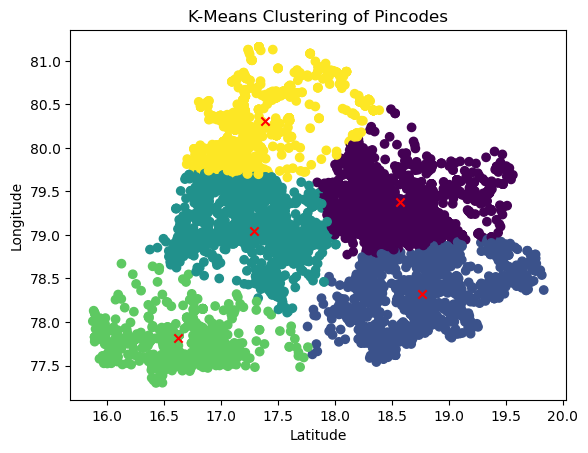

In [7]:
import numpy as np

def initialize_centroids(data, k):
    # Randomly choose k data points as initial centroids
    indices = np.random.choice(data.shape[0], k, replace=False)
    return data[indices]

def assign_clusters(data, centroids):
    # Calculate the distance of each point from the centroids
    distances = np.sqrt(((data - centroids[:, np.newaxis])**2).sum(axis=2))
    # Assign each point to the nearest centroid
    return np.argmin(distances, axis=0)

def update_centroids(data, clusters, k):
    new_centroids = np.array([data[clusters == i].mean(axis=0) for i in range(k)])
    return new_centroids

def kmeans(data, k, max_iters=100, tol=1e-4):
    centroids = initialize_centroids(data, k)
    for i in range(max_iters):
        clusters = assign_clusters(data, centroids)
        new_centroids = update_centroids(data, clusters, k)
        # Check for convergence
        if np.all(np.abs(new_centroids - centroids) < tol):
            break
        centroids = new_centroids
    return centroids, clusters

# Extract the longitude and latitude
coordinates = filtered_df[['Latitude', 'Longitude']].values

# Apply K-Means
k = 5  # Number of clusters
centroids, clusters = kmeans(coordinates, k)

# Add the cluster information to the original data
filtered_df['cluster'] = clusters

# Save the clustered data to a new CSV file
filtered_df.to_csv('clustered_pincodes.csv', index=False)

print("Centroids:", centroids)
print("Cluster assignments:", clusters)

import matplotlib.pyplot as plt

# Plot the data points and centroids
plt.scatter(coordinates[:, 0], coordinates[:, 1], c=clusters, cmap='viridis', marker='o')
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('K-Means Clustering of Pincodes')
plt.show()

In [8]:
map_center = [20.5937, 78.9629]  # Coordinates of India
map = folium.Map(location=map_center, zoom_start=5)

radius=1
# Add a marker for each pincode
coordinates= [[17.28905356, 79.04418965],
 [16.62475969, 77.81171513],
 [18.56999041, 79.37584797],
 [18.76154837, 78.3156957 ],
 [17.38480269, 80.30652235]]
for place in coordinates:
    folium.CircleMarker( location=place,
                radius=radius,
                color="black",
                weight=1,
                fill_opacity=0.6,
                opacity=1,
                fill=False,  # gets overridden by fill_color
                #popup=row['Pincode'],
                tooltip="Clusters Centroid",
                ).add_to(map)

    
# Display the map 
map